<a href="https://colab.research.google.com/github/EmanuelAlogna/MRI-generation/blob/master/results/p2p_70ep_genTFlair.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import libraries and mount the drive

In [1]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import os
from IPython import display
import time
import math

print(tf.__version__)

from google.colab import drive
drive.mount('/content/drive')

TensorFlow 2.x selected.
2.1.0-rc1
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Loading train, validation and test sets

In [0]:
def get_feature_description(modalities):                                                   
                                                                                           
    feature_description =lambda mod : {                                                    
                            mod+'_mri': tf.io.FixedLenFeature([], tf.string),              
                            mod+'_path': tf.io.FixedLenFeature([], tf.string),             
                                                                                           
                            mod+'_mri_min': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_min_src': tf.io.FixedLenFeature([], tf.float32),     
                            mod+'_mri_max': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_max_src': tf.io.FixedLenFeature([], tf.float32),     
                                                                                           
                            mod+'_mri_lperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_mri_lperc_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_x_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_y_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_x_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_y_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                                                                                           
                            mod+'_x_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_y_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_z_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                                                                                           
                            mod+'_z_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_x_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_y_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_patient': tf.io.FixedLenFeature([], tf.string),          
                            mod+'_sample_number': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_grade': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_location': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_version': tf.io.FixedLenFeature([], tf.string),  
                            mod+'_dataset_name': tf.io.FixedLenFeature([], tf.string),     
                            mod+'_mri_type': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_split': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_mri_seq': tf.io.FixedLenFeature([], tf.string),  
                          }                                                                
    features = {}                                                                          
    for mod in modalities:
        features.update(feature_description(mod))
    return features

In [0]:
#BUFFER_SIZE = 400
BATCH_SIZE = 32

In [0]:
use_gzip_compression = True

def load_dataset(name, mri_type, center_crop=None, random_crop=None, filter=None, batch_size=BATCH_SIZE, cache=True, 
                 prefetch_buffer=1, shuffle_buffer=128, interleave=1, cast_to=tf.float32, clip_labels_to=0.0, 
                 take_only=None, shuffle=True, infinite=False, n_threads=os.cpu_count()):
    def parse_sample(sample_proto):
        parsed = tf.io.parse_single_example(sample_proto, get_feature_description(["OT"]+mri_type))
        # Decoding image arrays
        
        slice_shape = [parsed['OT_x_dimension'.format(mri_type[0])], parsed['OT_y_dimension'], 1]
        # Decoding the ground truth
        parsed['seg'] = tf.cast(tf.reshape(tf.io.decode_raw(parsed['OT_mri'], tf.float32), shape=slice_shape), dtype=cast_to)
        # Decode each channel and stack in a 3d volume
        stacked_mri = list()
        for mod in mri_type:
            stacked_mri.append(tf.cast(tf.reshape(tf.io.decode_raw(parsed['{}_mri'.format(mod)], tf.float32), shape=slice_shape), dtype=cast_to))
        parsed['mri'] = tf.concat(stacked_mri, axis=-1)
        # Clipping the labels if requested
        parsed['seg'] = tf.clip_by_value(parsed['seg'], 0.0, clip_labels_to) if clip_labels_to else parsed['seg']
        
        # Cropping
        if random_crop or center_crop:
            # Stacking the mri and the label to align the crop shape
            mri_seg = tf.concat([parsed['mri'], parsed['seg']], axis=-1)
            if random_crop:
                random_crop[-1] = mri_seg.shape[-1] 
                cropped = tf.image.random_crop(mri_seg, size=random_crop)
            else:
                cropped = tf.image.resize_with_crop_or_pad(mri_seg,center_crop[0],center_crop[1])
            # Splitting back
            parsed['mri'] = cropped[:,:,:len(mri_type)]
            parsed['seg'] = cropped[:,:,len(mri_type):]
        
        return parsed
    
    path = './drive/My Drive/MRI-generation/{}.tfrecords'.format(name)
    dataset = tf.data.TFRecordDataset(path, compression_type='GZIP' if use_gzip_compression else "")
    dataset = dataset.filter(filter) if filter is not None else dataset
    dataset = dataset.take(take_only) if take_only is not None else dataset

    # You should generally cache after loading and preprocessing the data, 
    # but before shuffling, repeating, batching and prefetching”
    dataset = dataset.cache() if cache else dataset
    if shuffle and infinite:
        dataset = dataset.apply(tf.data.experimental.shuffle_and_repeat(shuffle_buffer))
    else:
        dataset = dataset.shuffle(shuffle_buffer, reshuffle_each_iteration=True) if shuffle else dataset
        dataset = dataset.repeat() if infinite else dataset
    dataset = dataset.map(parse_sample, num_parallel_calls=None)
    dataset = dataset.batch(batch_size) if batch_size > 0 else dataset
    

    if interleave > 1:
        dataset = dataset.interleave(lambda x: tf.data.Dataset.from_tensors(x).repeat(interleave), cycle_length=n_threads, block_length=interleave, num_parallel_calls=n_threads)
  
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

In [0]:
# loading all the dataset, with only modality T1 and T2
# I'll focus now on synthesizing T2 from T1

def load_datasets():
    validation = load_dataset('brats2015_validation_crop_mri', ['MR_T2', 'MR_Flair'], shuffle=False)
    training = load_dataset('brats2015_training_crop_mri', ['MR_T2', 'MR_Flair'], shuffle=True)
    testing = load_dataset('brats2015_testing_crop_mri', ['MR_T2', 'MR_Flair'], shuffle=True)
    return training, validation , testing

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

modalities = ['MR_T2_mri', 'MR_Flair_mri', 'OT_mri']

## Load some useful functions


In [0]:
# PROCESSING IMAGES IN THE BATCH
def process_batch(batch):   # takes in input a raw_record[mod].numpy()
    batch = tf.io.decode_raw(batch, tf.float32)
    batch = tf.reshape(batch, (BATCH_SIZE, 180, 180))
    paddings = tf.constant([[0, 0], [38, 38], [38, 38]])
    batch = tf.pad(batch, paddings, "CONSTANT")
    batch = tf.expand_dims(batch, axis=3)
    return batch
    
# final shape will be (bs, 256, 256, 1): now the batch is ready to be fed to the GAN

In [0]:
# this function preprocesses the input image and the ground truth from a raw_record
# images in the return are then ready to be fed into the GAN
def take_images_from_raw(raw_record, ot=False):

    inp, ground_truth = raw_record[modalities[0]], raw_record[modalities[1]]
    inp = process_batch(inp)
    ground_truth = process_batch(ground_truth)
    if ot:      # if ot is true, I'll retrieve also the segmentation from the raw_record
        segmentation = process_batch(raw_record[modalities[2]])
        return inp, ground_truth, segmentation
    return inp, ground_truth

In [0]:
def resize_with_crop(*args): # possibile arguments: input, gt, prediction and maybe the segmentation

    image0 = tf.image.resize_with_crop_or_pad(args[0], 155, 194)
    image1 = tf.image.resize_with_crop_or_pad(args[1], 155, 194)
    image2 = tf.image.resize_with_crop_or_pad(args[2], 155, 194)
    if len(args) == 4:      # crop also the segmentation, if is given as additional argument
        image3 = tf.image.resize_with_crop_or_pad(args[3], 155, 194)
        return image0, image1, image2, image3
    return image0, image1, image2

In [0]:
def retrieve_tumor_area(ground_truth, prediction, segmentation):
    ground_truth_np = ground_truth.numpy()
    segmentation_np = segmentation.numpy()
    prediction_np = prediction.numpy()

    # I want to remove all the pixels not relevant wrt the tumor area. 
    idx = (segmentation_np==0)      
    ground_truth_np[idx] = segmentation_np[idx]
    prediction_np[idx] = segmentation_np[idx]

    return ground_truth_np, prediction_np      # Now the images are ready to be evaluated

## Evaluate GAN

In [0]:
def evaluate_GAN(model, dataset, set_type, evaluate_tumor_area=False, print_loss=False, epc=99):
    num_batches = 0                 # CAREFUL when batch_size is modified!!!
    if set_type == 'test':
        num_batches = 112           # in the test set, with batch 32, there are 112 elements.
    elif set_type == 'validation':
        num_batches = 108
    elif set_type == 'train':
        num_batches = 876
    container_psnr = tf.TensorArray(tf.float32, size=num_batches)     
    container_mse = tf.TensorArray(tf.float32, size=num_batches)
    container_ssim = tf.TensorArray(tf.float32, size=num_batches)
    
    if evaluate_tumor_area:
        container_psnr_tumor = tf.TensorArray(tf.float32, size=num_batches)     
        container_mse_tumor = tf.TensorArray(tf.float32, size=num_batches)
        container_ssim_tumor = tf.TensorArray(tf.float32, size=num_batches)
    if print_loss:
        container_gen = tf.TensorArray(tf.float32, size=num_batches)     
        container_disc = tf.TensorArray(tf.float32, size=num_batches)
    
    #idx = 0
    #for raw_record in dataset.take(10):
    for idx, raw_record in dataset.enumerate():
        inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)
        # generate the prediction        
        prediction = model(inp, training=False)
        # crop the images
        inp_cr, ground_truth_cr, prediction_cr, segmentation_cr = resize_with_crop(inp, ground_truth, prediction, segmentation)
        if evaluate_tumor_area:
            ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth_cr, prediction_cr, segmentation_cr)
        if (idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83) and evaluate_tumor_area:
            plot_images_new(inp_cr, ground_truth_cr, prediction_cr, ground_truth_masked, prediction_masked)
        elif idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:
            plot_images_new(inp_cr, ground_truth_cr, prediction_cr)
        
        # normalize the prediction and the ground_truth
        prediction_normalized_cr = mean_normalize(prediction_cr)
        ground_truth_normalized_cr = mean_normalize(ground_truth_cr)

        # compute the metrics of similarity
        mean, std, psnr = compute_psnr(ground_truth_normalized_cr, prediction_normalized_cr)
        container_psnr = container_psnr.write(idx, psnr)
        mean, std, mse = compute_mse(ground_truth_normalized_cr, prediction_normalized_cr)
        container_mse = container_mse.write(idx, mse)
        mean, std, ssim = compute_ssim(ground_truth_normalized_cr, prediction_normalized_cr)
        container_ssim = container_ssim.write(idx, ssim)

        if evaluate_tumor_area:
            # discard black images from pred and gt
            prediction_masked_normalized = mean_normalize(prediction_masked)
            ground_truth_masked_normalized = mean_normalize(ground_truth_masked) 
            #if (epc % 8 == 1) and idx == 0:
            #    plot_images(ground_truth_masked, prediction_masked)
            mean, std, psnr = compute_psnr(ground_truth_masked_normalized, prediction_masked_normalized)
            container_psnr_tumor = container_psnr_tumor.write(idx, psnr)
            mean, std, mse = compute_mse(ground_truth_masked_normalized, prediction_masked_normalized)
            container_mse_tumor = container_mse_tumor.write(idx, mse)
            mean, std, ssim = compute_ssim(ground_truth_masked_normalized, prediction_masked_normalized)
            container_ssim_tumor = container_ssim_tumor.write(idx, ssim)

        # COMPUTES VALIDATION LOSSES FOR THE GENERATOR AND THE DISCRIMINATOR
        if print_loss:
            disc_real_output = discriminator([inp, ground_truth], training=False)
            disc_generated_output = discriminator([inp, prediction], training=False)
            gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, ground_truth)
            disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
            container_gen = container_gen.write(idx, gen_total_loss)
            container_disc = container_disc.write(idx, disc_loss)
        #idx += 1

    container_psnr = container_psnr.stack()
    container_mse = container_mse.stack()
    container_ssim = container_ssim.stack()
    mean_psnr = tf.reduce_mean(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    std_psnr = tf.math.reduce_std(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    mean_mse = tf.reduce_mean(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    std_mse = tf.math.reduce_std(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    mean_ssim = tf.reduce_mean(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))
    std_ssim = tf.math.reduce_std(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))

    print("PSNR on {} set: {} ± {}".format(set_type, (f'{mean_psnr:.4f}'), (f'{std_psnr:.4f}')))
    print("MSE on {} set: {} ± {}".format(set_type, (f'{mean_mse:.4f}'), (f'{std_mse:.4f}')))
    print("SSIM on {} set: {} ± {}".format(set_type, (f'{mean_ssim:.4f}'), (f'{std_ssim:.4f}')))

    if evaluate_tumor_area:
        container_psnr_tumor = container_psnr_tumor.stack()
        container_mse_tumor = container_mse_tumor.stack()
        container_ssim_tumor = container_ssim_tumor.stack()
        mean_psnr_tumor = tf.reduce_mean(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        std_psnr_tumor = tf.math.reduce_std(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        mean_mse_tumor = tf.reduce_mean(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        std_mse_tumor = tf.math.reduce_std(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        mean_ssim_tumor = tf.reduce_mean(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        std_ssim_tumor = tf.math.reduce_std(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        print()
        print("PSNR wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_psnr_tumor:.4f}'), (f'{std_psnr_tumor:.4f}')))
        print("MSE wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_mse_tumor:.4f}'), (f'{std_mse_tumor:.4f}')))
        print("SSIM wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_ssim_tumor:.4f}'), (f'{std_ssim_tumor:.4f}')))
    if print_loss:
        container_disc = container_disc.stack()
        container_gen = container_gen.stack()
        mean_gen = tf.reduce_mean(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        std_gen = tf.math.reduce_std(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        mean_disc = tf.reduce_mean(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        std_disc = tf.math.reduce_std(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        print()
        print("Generator loss on {} set: {} ± {}".format(set_type, (f'{mean_gen:.4f}'), (f'{std_gen:.4f}')))
        print("Discriminator loss on {} set: {} ± {}".format(set_type, (f'{mean_disc:.4f}'), (f'{std_disc:.4f}')))
        
    if tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, False):
        return mean_psnr, mean_mse, mean_ssim, mean_gen, mean_disc
    elif tf.equal(print_loss, False) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor
    elif tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor, mean_gen, mean_disc
    return mean_psnr, mean_mse, mean_ssim

In [12]:
"""s = 3
container_gen = tf.TensorArray(tf.float32, size=s)
container_disc = tf.TensorArray(tf.float32, size=s)
idx = 0

generator = Generator()
discriminator = Discriminator()

for raw_record in testing.take(s):
    input_image, target = take_images_from_raw(raw_record)

    prediction = generator(input_image, training=False)

    # showing to D a batch of real images of T2
    disc_real_output = discriminator([input_image, target], training=True)
    # showing to D a batch fake images of T2
    disc_generated_output = discriminator([input_image, prediction], training=True)
    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    container_gen = container_gen.write(idx, gen_total_loss)
    container_disc = container_disc.write(idx, disc_loss)

    idx += 1
container_gen = container_gen.stack()
container_disc = container_disc.stack()

mean_gen = tf.reduce_mean(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
std_gen = tf.math.reduce_std(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
print("GEN loss: {} ± {}".format((f'{mean_gen:.4f}'), (f'{std_gen:.4f}')))
mean_disc = tf.reduce_mean(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
std_disc = tf.math.reduce_std(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
print("DISC loss: {} ± {}".format((f'{mean_disc:.4f}'), (f'{std_disc:.4f}')))

plot_loss(mean_gen, mean_disc)
"""

's = 3\ncontainer_gen = tf.TensorArray(tf.float32, size=s)\ncontainer_disc = tf.TensorArray(tf.float32, size=s)\nidx = 0\n\ngenerator = Generator()\ndiscriminator = Discriminator()\n\nfor raw_record in testing.take(s):\n    input_image, target = take_images_from_raw(raw_record)\n\n    prediction = generator(input_image, training=False)\n\n    # showing to D a batch of real images of T2\n    disc_real_output = discriminator([input_image, target], training=True)\n    # showing to D a batch fake images of T2\n    disc_generated_output = discriminator([input_image, prediction], training=True)\n    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, target)\n    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)\n\n    container_gen = container_gen.write(idx, gen_total_loss)\n    container_disc = container_disc.write(idx, disc_loss)\n\n    idx += 1\ncontainer_gen = container_gen.stack()\ncontainer_disc = container_disc.stack()\n

In [0]:
def plot_loss(g_l, d_l):        
    f, (ax1) = plt.subplots(1, 1, figsize=(12, 6))
    f.subplots_adjust(hspace=0.4)
    max_epoch = g_l.shape[0]       # args[0] 
    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, g_l, label='Generator loss')
    ax1.plot(epoch_list, d_l, label='Discriminator Loss')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    ax1.set_ylim([0, 13])
    ax1.set_ylabel('Loss Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('LOSS on validation set')
    l1 = ax1.legend(loc="best")

In [0]:
def plot_metrics(*args):        # arguments will be, in order: psnr, mse, ssim, psnr_tumor*, mse_tumor*, ssim_tumor*
    tumor_area = False          # arguments with * are optional
    if len(args) == 6:
        tumor_area = True

    f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 20))
    f.subplots_adjust(hspace=0.4)

    max_epoch = (args[0]).shape[0]       # args[0] 

    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, args[0], label='PSNR')
    if tumor_area: 
        ax1.plot(epoch_list, args[3], label='PSNR on tumor area')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    ax1.set_ylabel('PSNR Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('PSNR')
    ax1.set_ylim([10, 36])
    l1 = ax1.legend(loc="best")

    ax2.plot(epoch_list, args[1], label='MSE')
    if tumor_area: 
        ax2.plot(epoch_list, args[4], label='MSE on tumor area')
    ax2.set_xticks(np.arange(1, max_epoch, 5))
    ax2.set_ylabel('MSE Value')
    ax2.set_xlabel('Epoch')
    ax2.set_title('MSE')
    ax2.set_ylim([0.0, 0.18])
    l2 = ax2.legend(loc="best")

    ax3.plot(epoch_list, args[2], label='SSIM')
    if tumor_area: 
        ax3.plot(epoch_list, args[5], label='SSIM on tumor area')
    ax3.set_xticks(np.arange(1, max_epoch, 5))
    ax3.set_ylabel('SSIM Value')
    ax3.set_xlabel('Epoch')
    ax3.set_title('SSIM')
    ax3.set_ylim([0.0,1.0])
    l3 = ax3.legend(loc="best")


In [0]:
# this method was tested to work with 5 and 32 images. Plotting 2, 3 or 4 types per time.

def plot_images(*args, images_to_print=5): 
    if images_to_print == 5: x = 15
    elif images_to_print == 32: x = 90
    if len(args) == 3:
        display_list = [args[0], args[1], args[2]]     # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (x , 9)
    elif len(args) == 2:
        display_list = [args[0], args[1]]     # input and gt
        title = ['GT in tumor area', 'Pred in tumor area']
        figsize = (x , 7)
    elif len(args) == 4:
        display_list = [args[0], args[1], args[2], args[3]]     # gt, prediction, gt_masked, prediction_masked
        title = ['Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']
        figsize = (x , 12)
    elif len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]     # input, gt, prediction, gt_masked, prediction_masked
        title = ['Input', 'Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']
        figsize = (x , 15)
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):
        for j in range(images_to_print):    # batch size is different from 10, but let's show just 10 images.
            n += 1
            plt.subplot(len(args)+1, images_to_print, n).title.set_text(title[i])
            plt.imshow(tf.squeeze(display_list[i][j]), cmap='bone')
            plt.axis('off')
    plt.show()
    print()

In [0]:
# this method was tested to work with 5 and 32 images. Plotting 2, 3 or 4 types per time.

def plot_images_new(*args): 

    if len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]   # input, gt, prediction, gt masked, pred masked
        title = ['Input Image', 'Ground Truth', 'Predicted Image', 'GT Tumor', 'Pred Tumor']
        figsize = (14, 7)
    elif len(args) == 3:
        display_list = [args[0], args[1], args[2]]   # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (8, 4)
    
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):    # batch size is different from 10, but let's show just 10 images.
        n += 1
        plt.subplot(1, len(args), n).title.set_text(title[i])
        plt.imshow(tf.squeeze(display_list[i][0]), cmap='bone')
        plt.axis('off')
    plt.show()

In [17]:
"""idx = 0
#for raw_record in validation.take(40):
for idx, raw_record in enumerate(validation):
    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)
    
    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)
    gen_output = generator(inp, training=False)
    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)
    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)
    
    # id = 46.. check it
    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:
        plot_images_new(inp, ground_truth, gen_output)
    idx += 1"""

'idx = 0\n#for raw_record in validation.take(40):\nfor idx, raw_record in enumerate(validation):\n    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)\n    \n    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)\n    gen_output = generator(inp, training=False)\n    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)\n    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)\n    \n    # id = 46.. check it\n    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:\n        plot_images_new(inp, ground_truth, gen_output)\n    idx += 1'

## Min-max normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/73032b45bffd5e5140483fbe1ed49bf174f1962d)

In [0]:
def min_max_rescale(x, xmin, xmax, a, b):
    return (a + (b-a)*(x-xmin)/(xmax-xmin))  
    # to rescale in the range [0, 1], 'a' must be 0 and 'b' = 1

In [0]:
@tf.function
def min_max_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = min_max_rescale(image[i], min_value, max_value, 0, 1)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized

## Mean normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/5c591a0eeba163a12f69f937adbae5886d6273db)

In the paper they say: "Each patient scan is normalized by dividing each sequence by its mean intensity value. "
But the formula is taken from a lecture from Andrew Ng, where he defines the Mean normalization as in the formula above. (resource: https://www.youtube.com/watch?v=e1nTgoDI_m8)

See also: https://stats.stackexchange.com/questions/138046/normalizations-dividing-by-mean

In [0]:
def mean_rescale(x, xmin, xmax):
    mean = tf.reduce_mean(x)
    return ((x-mean)/(xmax-xmin)) 

In [0]:
@tf.function
def mean_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = mean_rescale(image[i], min_value, max_value)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized
    

## Discard black images from batch (put values to 'nan')

This normalization is just to test the metrics and see if there is a big difference in normalizing the prediction and the gt.
This method is used to normalize (and so put to 'nan') only the black images, while the other images of the batch are kept with the original values. This allows me to discard the black images in the computation of the metrics.

In [0]:
def black_images_to_nan(image): 
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])

        # if the max = min most likely it's a black image (or an image without any important information)
        if tf.math.equal(max_value, min_value):        
            x = mean_rescale(image[i], min_value, max_value)
            image_normalized = image_normalized.write(i, x)
        else:
            image_normalized = image_normalized.write(i, image[i])
    image_normalized = image_normalized.stack()
    return image_normalized

##Defining all the quantitative metrics (PSNR, SSIM and MSE)

In [0]:
def compute_psnr(image1, image2):
    # Compute PSNR over tf.float32 Tensors.
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    psnr = tf.image.psnr(im1, im2, max_val=1.0)
    mean = tf.reduce_mean(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    std = tf.math.reduce_std(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    # In the computation of mean and std, I'm ignoring the 'nan' and 'inf' values
    # Why 'nan' values? 'nan' happens when there is an image with max_value and min_value = 0.0 so a black image
    # the PSNR would be inf (image is totally similar to the ground truth)
    # be rescaling the image, the max_value and min_value would become nan and so the PSNR

    # It ignores also the 'inf' values, in the case I don't want to normalize
    
    return mean, std, psnr

In [0]:
def compute_ssim(image1, image2):
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    ssim = tf.image.ssim(im1, im2, max_val=1)
    mean = tf.reduce_mean(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    std = tf.math.reduce_std(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    #print(ssim)
    return mean, std, ssim

In [0]:
# I want to compute, first thing, the MSE between ground truth and generated one. The tf.function gives me a Tensor 32x256x256:
# MSE is computed PIXEL per PIXEL, so per each of the 32 matrix 256x256, I average (1) the values of the 256x256 pixels obtaining
# an array of 32 elements, containing the MSEs of each image belonging to the batch. Then I can average (2) these 32 to have 
# I should not average the whole 32x256x256 in one step. The result would have same mean but slightly different std.
# I want first to obtain the MSE of each image... then I average across the batch only to have smth more accurate.

def compute_mse(image1, image2):       # mean squared error
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    mse = tf.metrics.mean_squared_error(im1,im2)
    # In this way is possible to do Variable item-assignment with tensors 
    mse_per_image = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        x = tf.reduce_mean(tf.boolean_mask((mse[i]), tf.math.is_finite(mse[i]))) 
        mse_per_image = mse_per_image.write(i, x)
    mse_per_image = mse_per_image.stack()
    mean = tf.reduce_mean(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    std = tf.math.reduce_std(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    return mean, std, mse_per_image

## Defining models and optimizers

In [0]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 1

In [0]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [0]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [0]:
# hint from the web: Unfortunately, UNet does not work with arbitrary input sizes. Try ResNet instead.

def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,1], batch_size=BATCH_SIZE)

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]
  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]
  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same',
                                         kernel_initializer=initializer,activation='tanh') # (bs, 256, 256, 1)
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [0]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    #print(l1_loss.numpy(), l1_loss.numpy()*LAMBDA)
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)


    return total_gen_loss, gan_loss, l1_loss

In [0]:
generator = Generator()

In [0]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image', batch_size=BATCH_SIZE)
  tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image', batch_size=BATCH_SIZE)

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1) #(bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [0]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [0]:
discriminator = Discriminator()

In [0]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [37]:
"""for raw_record in testing.take(1):
    t1, t2, segmentation = take_images_from_raw(raw_record, ot=True)
    # generate the prediction            
    prediction = generator(t1, training=False)

    # showing to D a batch of real images of T2
    disc_real_output = discriminator([t1, t2], training=True)
    
    # showing to D a batch fake images of T2
    disc_generated_output = discriminator([t1, prediction], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, t2)
    
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    print(gen_total_loss.numpy(), gen_gan_loss.numpy(), gen_l1_loss.numpy())"""


'for raw_record in testing.take(1):\n    t1, t2, segmentation = take_images_from_raw(raw_record, ot=True)\n    # generate the prediction            \n    prediction = generator(t1, training=False)\n\n    # showing to D a batch of real images of T2\n    disc_real_output = discriminator([t1, t2], training=True)\n    \n    # showing to D a batch fake images of T2\n    disc_generated_output = discriminator([t1, prediction], training=True)\n\n    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, t2)\n    \n    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)\n\n    print(gen_total_loss.numpy(), gen_gan_loss.numpy(), gen_l1_loss.numpy())'

In [38]:
"""for raw_record in validation.take(10):
    
    inp, ground_truth = take_images_from_raw(raw_record)
    gen_output = generator(inp, training=False)

    mean, std, mse_per_image = compute_mse(ground_truth, gen_output)
    print(mean.numpy())  

    l2_loss = tf.reduce_mean(tf.math.squared_difference(ground_truth, gen_output))

    # so l2_loss gives us the right MSE (mean squared error) between ground_truth and gen_output
    # so do that it's the same as computing the MSE of each image (mse_per_image) and then compute the mean of the mse_per_image
    print(l2_loss.numpy())
    print()"""

"for raw_record in validation.take(10):\n    \n    inp, ground_truth = take_images_from_raw(raw_record)\n    gen_output = generator(inp, training=False)\n\n    mean, std, mse_per_image = compute_mse(ground_truth, gen_output)\n    print(mean.numpy())  \n\n    l2_loss = tf.reduce_mean(tf.math.squared_difference(ground_truth, gen_output))\n\n    # so l2_loss gives us the right MSE (mean squared error) between ground_truth and gen_output\n    # so do that it's the same as computing the MSE of each image (mse_per_image) and then compute the mean of the mse_per_image\n    print(l2_loss.numpy())\n    print()"

## Let's load now the generator, discriminator weights and optimizers status from the checkpoints



Uncomment this only to continue to train an already trained network. Otherwise it will be trained a new GAN

In [39]:

print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))

checkpoint_path = "./drive/My Drive/checkpoints/gen_tflair_p2p"

ckpt = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                discriminator_optimizer=discriminator_optimizer,
                                generator=generator,
                                discriminator=discriminator)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)


# if a checkpoint exists, restore the latest checkpoint.

if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')



"""
idx = 0     # this is the checkpoint that will be restored.

if len(ckpt_manager.checkpoints) > 0:    # then there is a checkpoint to restore
    ckpt.restore(ckpt_manager.checkpoints[idx])
    print ('Latest checkpoint restored!!')
print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))
print()
"""

Optimizers and models defined but not initialized? True
Latest checkpoint restored!!


'\nidx = 0     # this is the checkpoint that will be restored.\n\nif len(ckpt_manager.checkpoints) > 0:    # then there is a checkpoint to restore\n    ckpt.restore(ckpt_manager.checkpoints[idx])\n    print (\'Latest checkpoint restored!!\')\nprint("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))\nprint()\n'

Now the GAN is restored to the previous checkpoint and ready to be trained again !!!

##**TRAIN STEP**

In [0]:
@tf.function
def train_step(input_image, target):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        
        # G produces fake images of T2
        gen_output = generator(input_image, training=True)

        # showing to D a batch of real images of T2
        # t1 is the input image, t2 is the target (ground_truth)
        disc_real_output = discriminator([input_image, target], training=True)
        
        # showing to D a batch fake images of T2
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)


    generator_gradients = gen_tape.gradient(gen_total_loss,
                                            generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                            generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                                discriminator.trainable_variables))

    #return loss, style_loss, content_loss, tot_loss
    #return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

In [0]:
def fit(train_ds, epochs, val_ds, save_checkpoint, epochs_already_trained, tumor_area, loss):

    psnr_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    mse_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    ssim_to_plot = tf.TensorArray(tf.float32, size=epochs+1) 
    if tumor_area:
        psnr_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        mse_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        ssim_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1) 
    if loss:
        g_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
        d_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)

    for epoch in range(epochs):
        if epoch == 0:
            ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
            if tf.equal(tumor_area, True) and tf.equal(loss, False):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, False) and tf.equal(loss, True):
                psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, True) and tf.equal(loss, True):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            else: 
                psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
            psnr_to_plot = psnr_to_plot.write(epoch, psnr)
            mse_to_plot = mse_to_plot.write(epoch, mse)
            ssim_to_plot = ssim_to_plot.write(epoch, ssim)
            if tumor_area:
                psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch, psnr_tumor)
                mse_to_plot_tumor = mse_to_plot_tumor.write(epoch, mse_tumor)
                ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch, ssim_tumor)
            if loss:
                g_loss_to_plot = g_loss_to_plot.write(epoch, g_loss)
                d_loss_to_plot = d_loss_to_plot.write(epoch, d_loss)
            ################################################################################################
            #ckpt_save_path = ckpt_manager.save()
        start = time.time()
        print()
        print("Epoch: ", epoch + 1 + epochs_already_trained)     # I start with epoch 1: the first iteration (not epoch 0)

        # Train
        n = 0
        #for raw_record in train_ds.take(32):
        for idx, raw_record in train_ds.enumerate():
            n += 1
            input_image, target = take_images_from_raw(raw_record)
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
                print(n+1)
            # This is the actual TRAINING STEP
            train_step(input_image, target)
        ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
        if tf.equal(tumor_area, True) and tf.equal(loss, False):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, False) and tf.equal(loss, True):
            psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, True) and tf.equal(loss, True):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        else: 
            psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
        psnr_to_plot = psnr_to_plot.write(epoch+1, psnr)
        mse_to_plot = mse_to_plot.write(epoch+1, mse)
        ssim_to_plot = ssim_to_plot.write(epoch+1, ssim)
        if tumor_area:
            psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch+1, psnr_tumor)
            mse_to_plot_tumor = mse_to_plot_tumor.write(epoch+1, mse_tumor)
            ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch+1, ssim_tumor)
        if loss:
            g_loss_to_plot = g_loss_to_plot.write(epoch+1, g_loss)
            d_loss_to_plot = d_loss_to_plot.write(epoch+1, d_loss)
            ################################################################################################
        print()

        # saving (checkpoint) the model every 8 epochs
        if (epoch + 1) % 5 == 0 and save_checkpoint:
            ckpt_save_path = ckpt_manager.save()
            print ('Saving checkpoint for epoch {} at {}'.format(epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))

        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1 + epochs_already_trained,
                                                            time.time()-start))
    if save_checkpoint:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving {} checkpoint for epoch {} at {}'.format("FINAL", epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))

    psnr_to_plot = psnr_to_plot.stack()
    mse_to_plot = mse_to_plot.stack()
    ssim_to_plot = ssim_to_plot.stack()
    if tumor_area:
        psnr_to_plot_tumor = psnr_to_plot_tumor.stack()
        mse_to_plot_tumor = mse_to_plot_tumor.stack()
        ssim_to_plot_tumor = ssim_to_plot_tumor.stack()
    if loss:
        g_loss_to_plot = g_loss_to_plot.stack()
        d_loss_to_plot = d_loss_to_plot.stack()
        
    if tf.equal(loss, True) and tf.equal(tumor_area, False):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, g_loss_to_plot, d_loss_to_plot
    elif tf.equal(loss, False) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor
    elif tf.equal(loss, True) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor, g_loss_to_plot, d_loss_to_plot
    return psnr_to_plot, mse_to_plot, ssim_to_plot

In [0]:
!pip install -q pyyaml h5py  # Required to save models in HDF5 format

## Fit of the model (at the end it will also save the models)

I save the models (I would need to save only the generator to be precise) in the same cell of the fitting because Google Colab, with long-run execution, doesn't allow to execute other cells after the one where I call 'fit'

Suggestion: train for around 35 epochs. Long-run are discouraged since Google Colab will crash.
Last time it arrived until the 43th epoch (409 seconds each).
So MAX TRAINING TIME ALLOWED: almost 5 hours. -> after that GPU won't be available for 8 hours or so

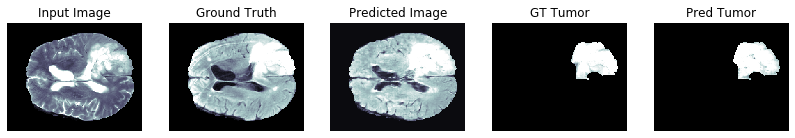

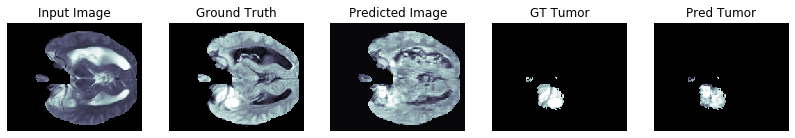

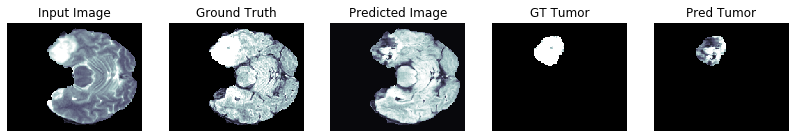

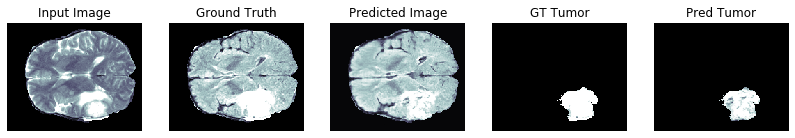

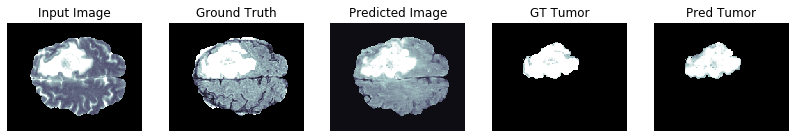

PSNR on validation set: 21.2038 ± 3.7628
MSE on validation set: 0.0102 ± 0.0097
SSIM on validation set: 0.7349 ± 0.1259

PSNR wrt tumor area on validation set: 32.2265 ± 9.7496
MSE wrt tumor area on validation set: 0.0016 ± 0.0020
SSIM wrt tumor area on validation set: 0.9664 ± 0.0371

Generator loss on validation set: 2.7048 ± 1.0648
Discriminator loss on validation set: 1.4004 ± 0.0084

Epoch:  48
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.........................................................................

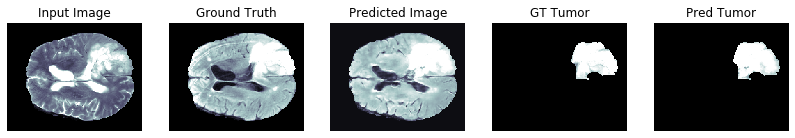

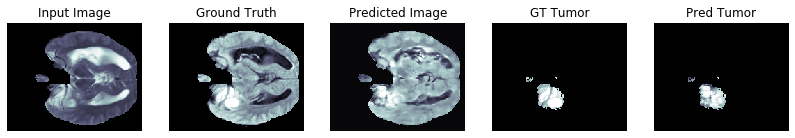

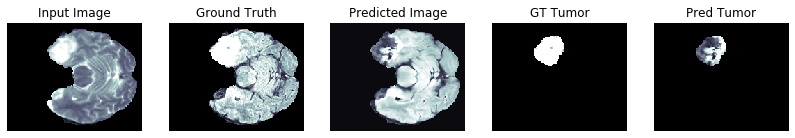

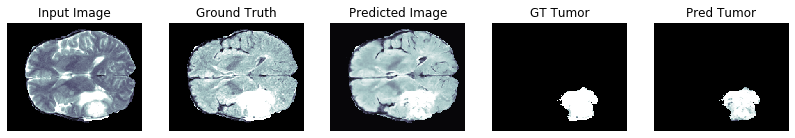

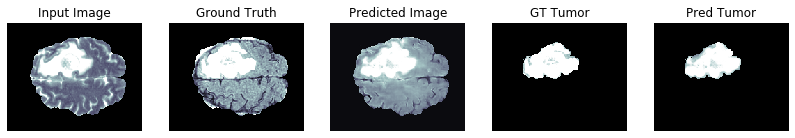

PSNR on validation set: 21.3698 ± 3.7455
MSE on validation set: 0.0100 ± 0.0097
SSIM on validation set: 0.7525 ± 0.1208

PSNR wrt tumor area on validation set: 32.5355 ± 8.3614
MSE wrt tumor area on validation set: 0.0014 ± 0.0019
SSIM wrt tumor area on validation set: 0.9695 ± 0.0355

Generator loss on validation set: 2.6244 ± 1.0472
Discriminator loss on validation set: 1.4421 ± 0.0280

Time taken for epoch 48 is 419.868705034256 sec


Epoch:  49
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.......................

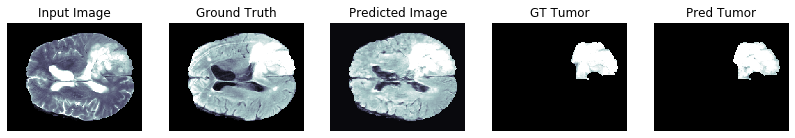

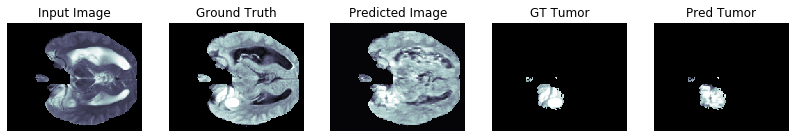

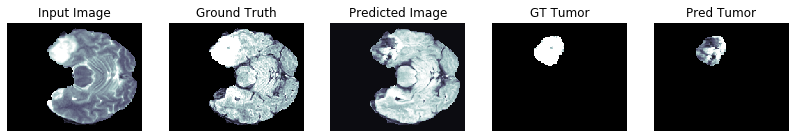

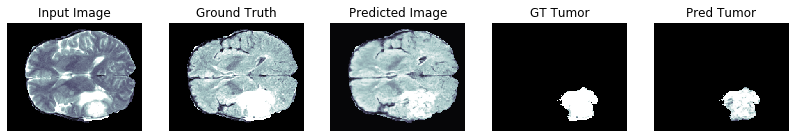

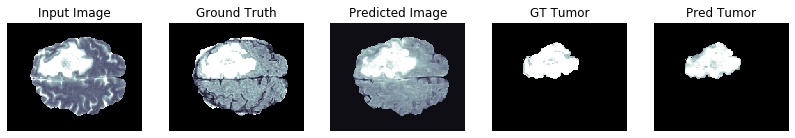

PSNR on validation set: 21.3555 ± 3.7916
MSE on validation set: 0.0100 ± 0.0098
SSIM on validation set: 0.7367 ± 0.1267

PSNR wrt tumor area on validation set: 32.4737 ± 8.1940
MSE wrt tumor area on validation set: 0.0014 ± 0.0018
SSIM wrt tumor area on validation set: 0.9679 ± 0.0345

Generator loss on validation set: 2.7074 ± 1.0930
Discriminator loss on validation set: 1.3944 ± 0.0076

Time taken for epoch 49 is 414.5417003631592 sec


Epoch:  50
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

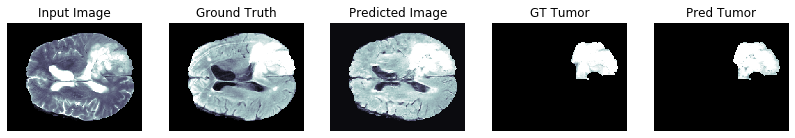

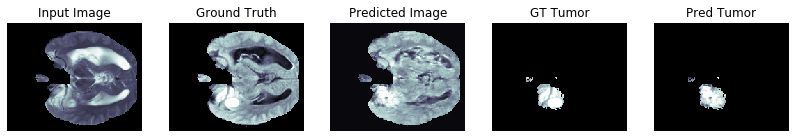

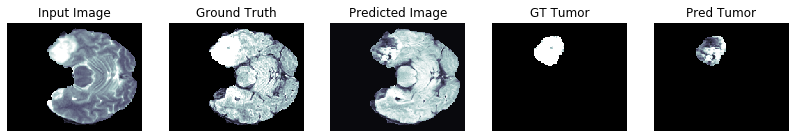

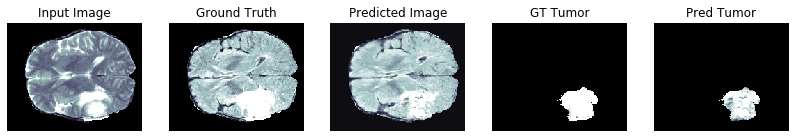

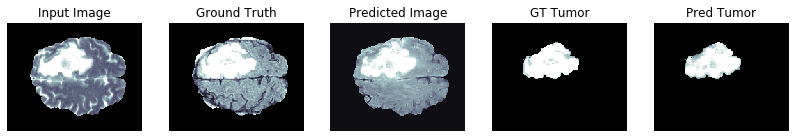

PSNR on validation set: 21.3434 ± 3.7670
MSE on validation set: 0.0100 ± 0.0097
SSIM on validation set: 0.7364 ± 0.1264

PSNR wrt tumor area on validation set: 32.5175 ± 9.0183
MSE wrt tumor area on validation set: 0.0014 ± 0.0018
SSIM wrt tumor area on validation set: 0.9677 ± 0.0349

Generator loss on validation set: 2.6347 ± 1.1156
Discriminator loss on validation set: 1.4569 ± 0.0163

Time taken for epoch 50 is 414.33707189559937 sec


Epoch:  51
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

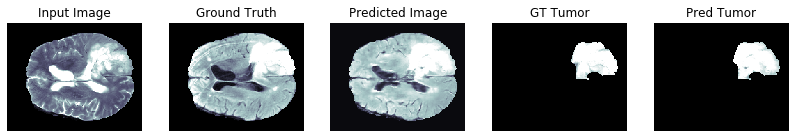

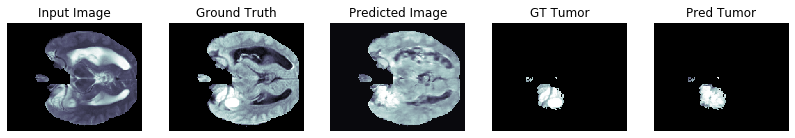

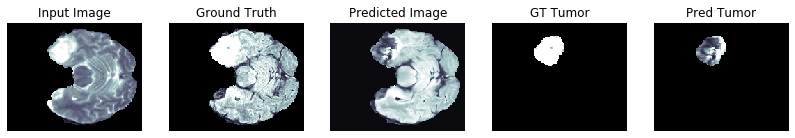

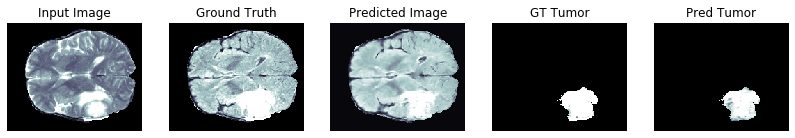

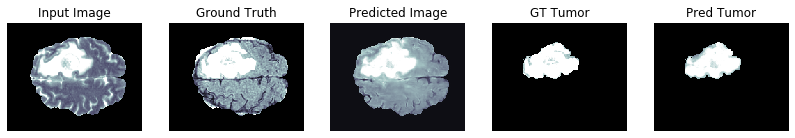

PSNR on validation set: 21.6842 ± 3.8148
MSE on validation set: 0.0094 ± 0.0096
SSIM on validation set: 0.7559 ± 0.1209

PSNR wrt tumor area on validation set: 33.2677 ± 10.0439
MSE wrt tumor area on validation set: 0.0013 ± 0.0018
SSIM wrt tumor area on validation set: 0.9712 ± 0.0324

Generator loss on validation set: 2.3432 ± 1.0595
Discriminator loss on validation set: 1.8651 ± 0.1677

Time taken for epoch 51 is 414.0412175655365 sec


Epoch:  52
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

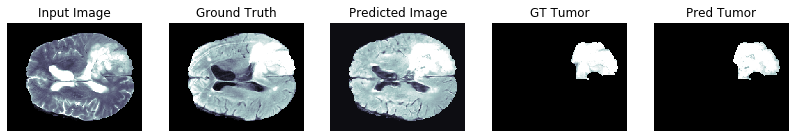

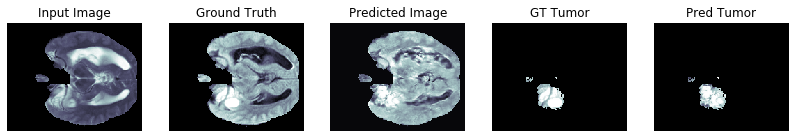

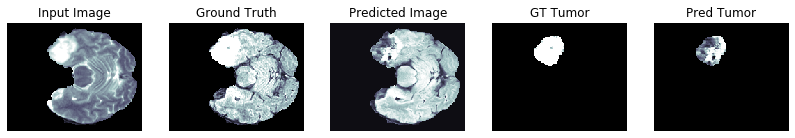

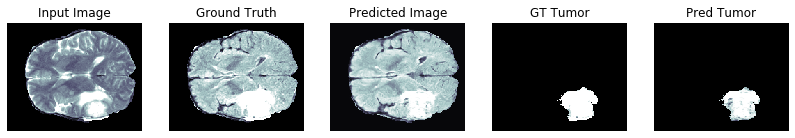

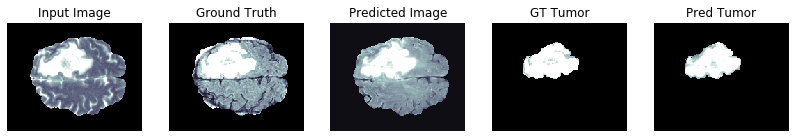

PSNR on validation set: 21.3561 ± 3.7802
MSE on validation set: 0.0100 ± 0.0097
SSIM on validation set: 0.7413 ± 0.1247

PSNR wrt tumor area on validation set: 32.5867 ± 9.0762
MSE wrt tumor area on validation set: 0.0014 ± 0.0018
SSIM wrt tumor area on validation set: 0.9691 ± 0.0326

Generator loss on validation set: 2.7012 ± 1.1643
Discriminator loss on validation set: 1.6163 ± 0.0329

Saving checkpoint for epoch 52 at ./drive/My Drive/checkpoints/gen_tflair_p2p/ckpt-11
Time taken for epoch 52 is 417.33960914611816 sec


Epoch:  53
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
........................................

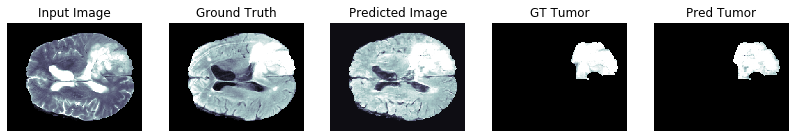

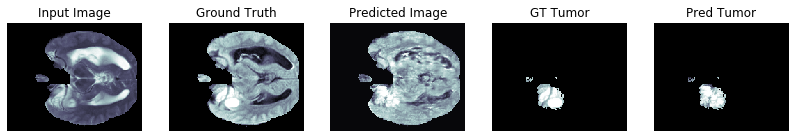

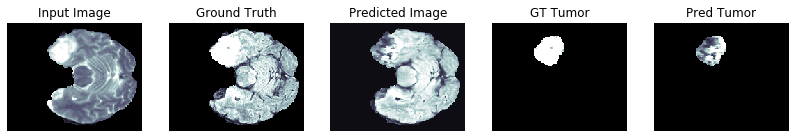

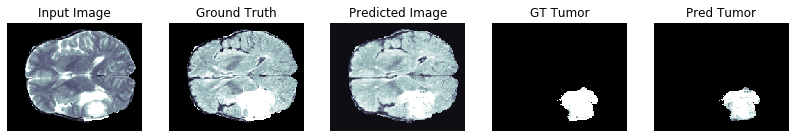

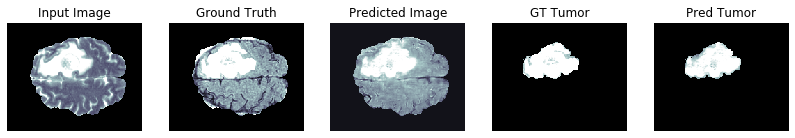

PSNR on validation set: 21.1861 ± 3.7647
MSE on validation set: 0.0103 ± 0.0097
SSIM on validation set: 0.7298 ± 0.1289

PSNR wrt tumor area on validation set: 32.9401 ± 11.7732
MSE wrt tumor area on validation set: 0.0014 ± 0.0018
SSIM wrt tumor area on validation set: 0.9687 ± 0.0359

Generator loss on validation set: 2.7611 ± 1.0555
Discriminator loss on validation set: 1.4628 ± 0.0415

Time taken for epoch 53 is 413.7920334339142 sec


Epoch:  54
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

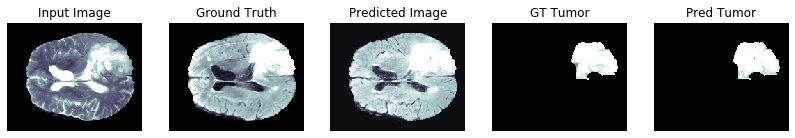

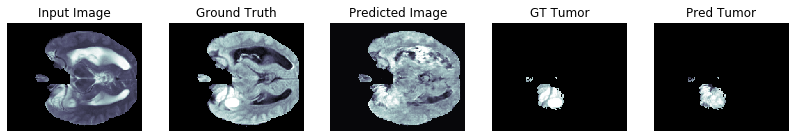

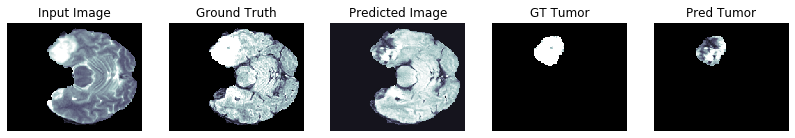

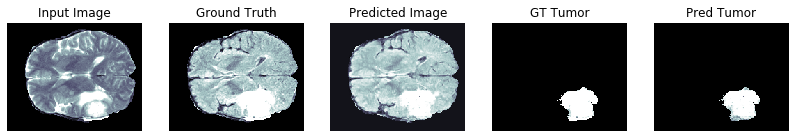

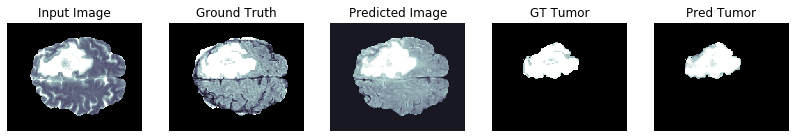

PSNR on validation set: 21.1977 ± 3.6836
MSE on validation set: 0.0103 ± 0.0099
SSIM on validation set: 0.7348 ± 0.1245

PSNR wrt tumor area on validation set: 33.2438 ± 8.1726
MSE wrt tumor area on validation set: 0.0012 ± 0.0016
SSIM wrt tumor area on validation set: 0.9732 ± 0.0308

Generator loss on validation set: 2.7171 ± 1.1461
Discriminator loss on validation set: 1.5253 ± 0.0226

Time taken for epoch 54 is 413.8519024848938 sec


Epoch:  55
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

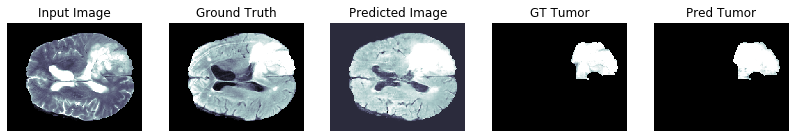

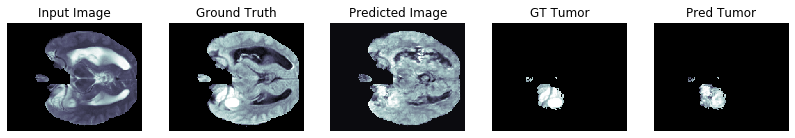

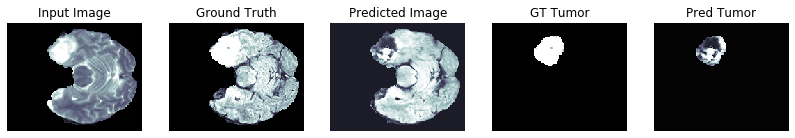

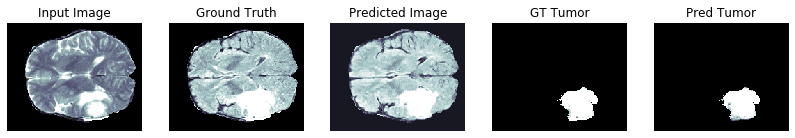

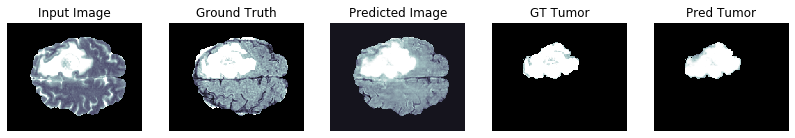

PSNR on validation set: 20.7336 ± 3.5710
MSE on validation set: 0.0111 ± 0.0097
SSIM on validation set: 0.7273 ± 0.1235

PSNR wrt tumor area on validation set: 32.7906 ± 10.0487
MSE wrt tumor area on validation set: 0.0015 ± 0.0022
SSIM wrt tumor area on validation set: 0.9709 ± 0.0377

Generator loss on validation set: 2.8727 ± 1.0989
Discriminator loss on validation set: 1.4604 ± 0.0410

Time taken for epoch 55 is 413.95769023895264 sec


Epoch:  56
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

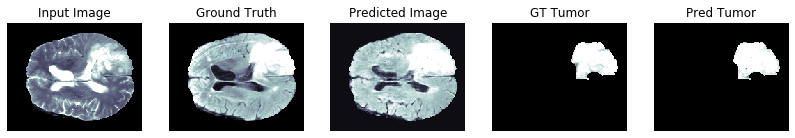

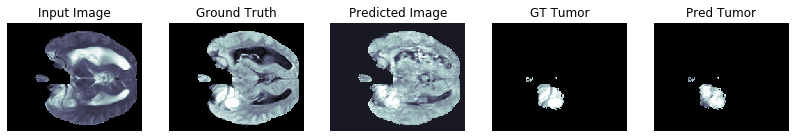

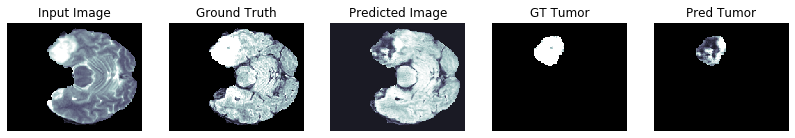

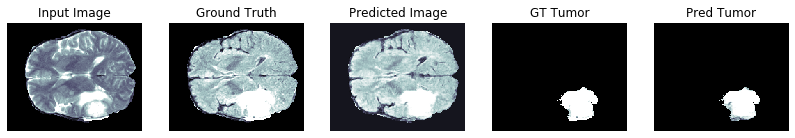

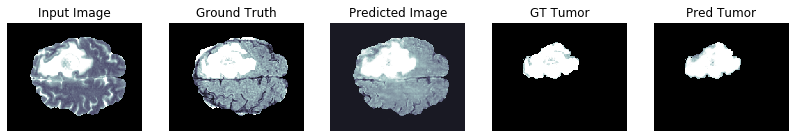

PSNR on validation set: 20.9590 ± 3.6630
MSE on validation set: 0.0107 ± 0.0097
SSIM on validation set: 0.7301 ± 0.1242

PSNR wrt tumor area on validation set: 32.5783 ± 8.0337
MSE wrt tumor area on validation set: 0.0015 ± 0.0023
SSIM wrt tumor area on validation set: 0.9705 ± 0.0365

Generator loss on validation set: 2.6659 ± 1.1055
Discriminator loss on validation set: 1.4839 ± 0.0511

Time taken for epoch 56 is 413.95939660072327 sec


Epoch:  57
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

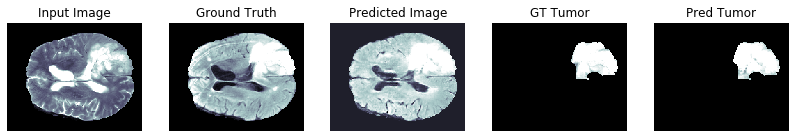

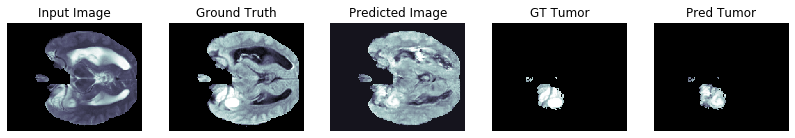

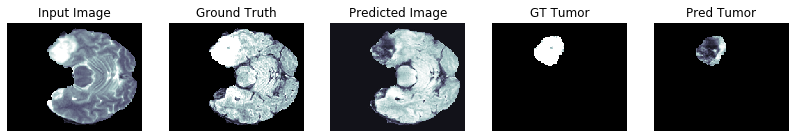

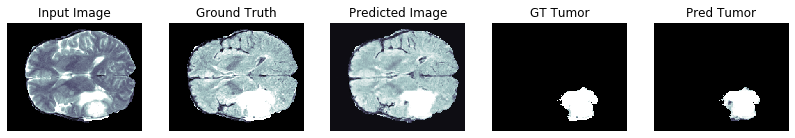

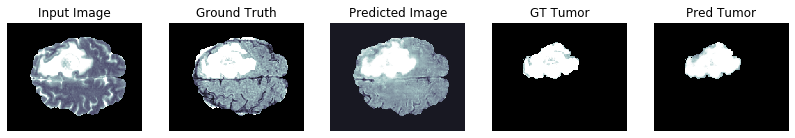

PSNR on validation set: 20.9807 ± 3.6072
MSE on validation set: 0.0106 ± 0.0097
SSIM on validation set: 0.7334 ± 0.1217

PSNR wrt tumor area on validation set: 33.2069 ± 10.3331
MSE wrt tumor area on validation set: 0.0013 ± 0.0021
SSIM wrt tumor area on validation set: 0.9725 ± 0.0354

Generator loss on validation set: 2.6855 ± 1.0724
Discriminator loss on validation set: 1.4586 ± 0.0291

Saving checkpoint for epoch 57 at ./drive/My Drive/checkpoints/gen_tflair_p2p/ckpt-12
Time taken for epoch 57 is 417.3166265487671 sec


Epoch:  58
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
........................................

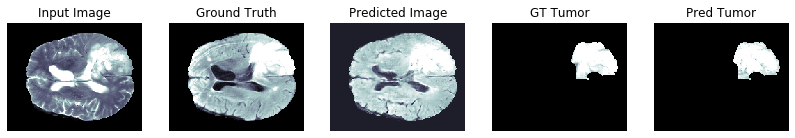

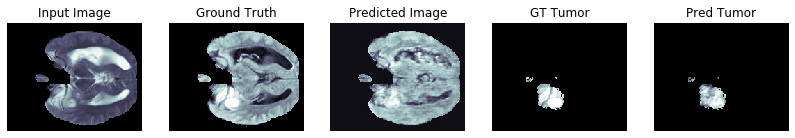

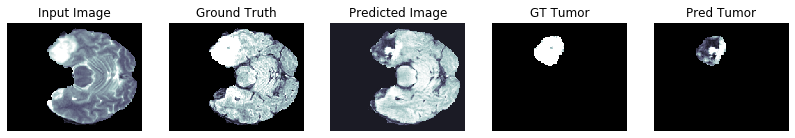

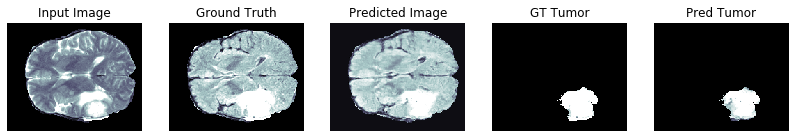

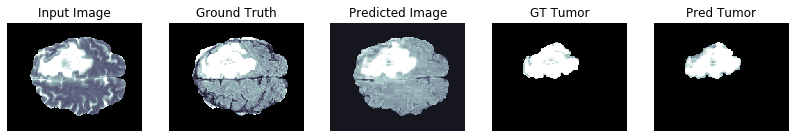

PSNR on validation set: 21.0434 ± 3.5870
MSE on validation set: 0.0105 ± 0.0097
SSIM on validation set: 0.7310 ± 0.1241

PSNR wrt tumor area on validation set: 32.5940 ± 7.9304
MSE wrt tumor area on validation set: 0.0014 ± 0.0019
SSIM wrt tumor area on validation set: 0.9699 ± 0.0365

Generator loss on validation set: 4.7516 ± 1.8864
Discriminator loss on validation set: 3.3727 ± 0.8975

Time taken for epoch 58 is 413.7630515098572 sec


Epoch:  59
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

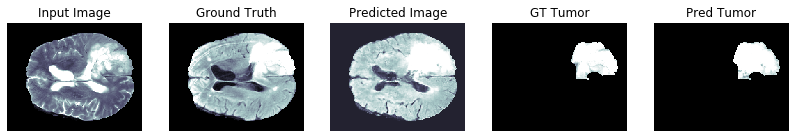

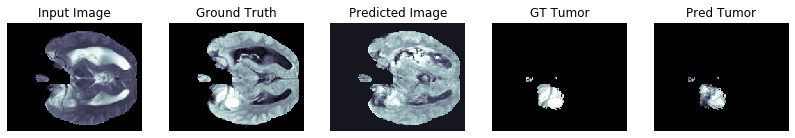

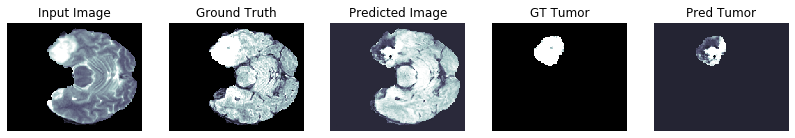

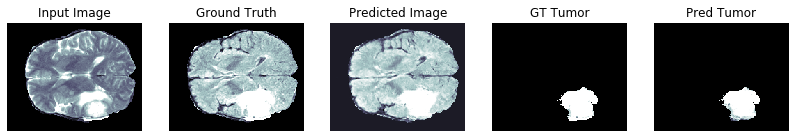

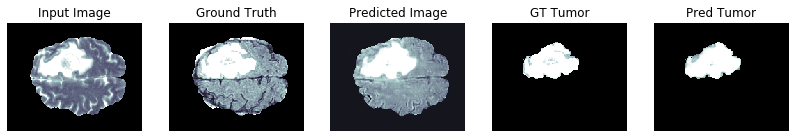

PSNR on validation set: 20.6611 ± 3.5788
MSE on validation set: 0.0113 ± 0.0098
SSIM on validation set: 0.7261 ± 0.1215

PSNR wrt tumor area on validation set: 32.4356 ± 8.2943
MSE wrt tumor area on validation set: 0.0016 ± 0.0026
SSIM wrt tumor area on validation set: 0.9696 ± 0.0413

Generator loss on validation set: 2.6423 ± 1.1413
Discriminator loss on validation set: 1.9222 ± 0.1039

Time taken for epoch 59 is 413.95397543907166 sec


Epoch:  60
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

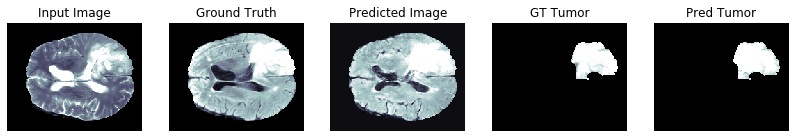

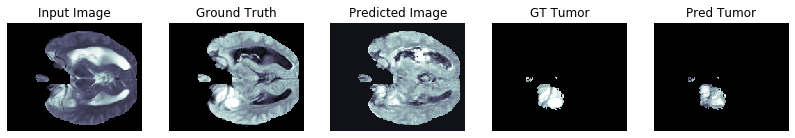

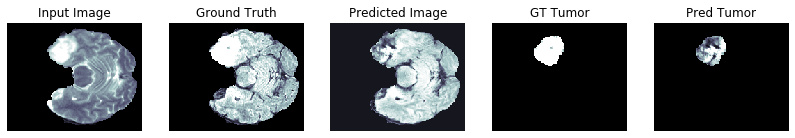

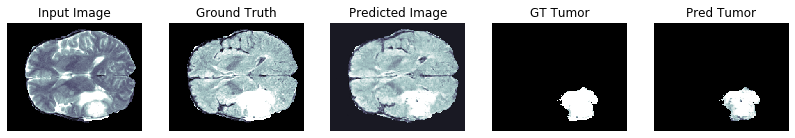

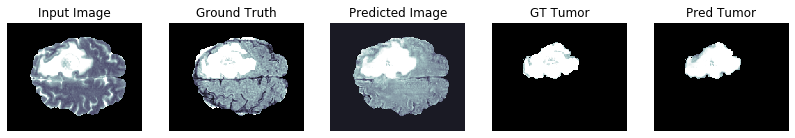

PSNR on validation set: 20.8351 ± 3.5897
MSE on validation set: 0.0110 ± 0.0097
SSIM on validation set: 0.7288 ± 0.1236

PSNR wrt tumor area on validation set: 32.6985 ± 8.9242
MSE wrt tumor area on validation set: 0.0014 ± 0.0020
SSIM wrt tumor area on validation set: 0.9710 ± 0.0335

Generator loss on validation set: 4.0037 ± 0.9276
Discriminator loss on validation set: 2.1381 ± 0.1431

Time taken for epoch 60 is 413.98056292533875 sec


Epoch:  61
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

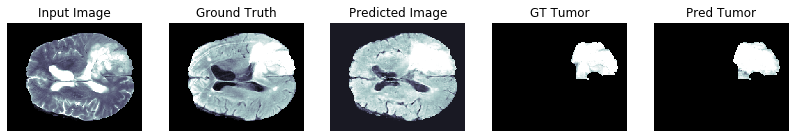

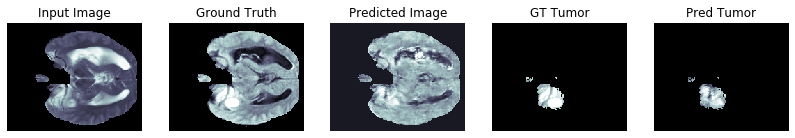

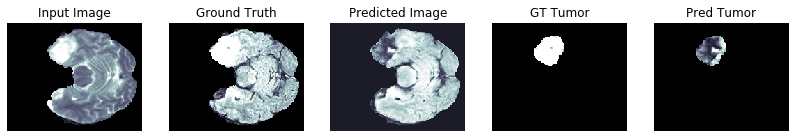

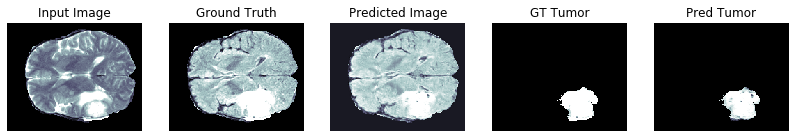

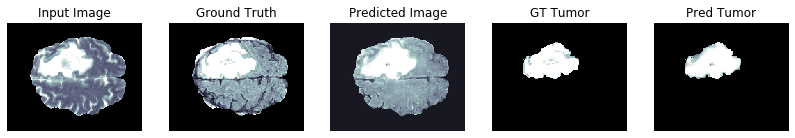

PSNR on validation set: 20.7580 ± 3.5293
MSE on validation set: 0.0110 ± 0.0096
SSIM on validation set: 0.7265 ± 0.1235

PSNR wrt tumor area on validation set: 32.3569 ± 9.0412
MSE wrt tumor area on validation set: 0.0016 ± 0.0024
SSIM wrt tumor area on validation set: 0.9685 ± 0.0374

Generator loss on validation set: 2.5067 ± 1.0566
Discriminator loss on validation set: 1.7138 ± 0.0597

Time taken for epoch 61 is 414.41387033462524 sec


Epoch:  62
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

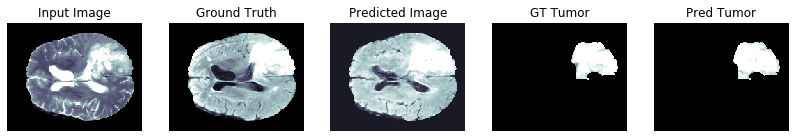

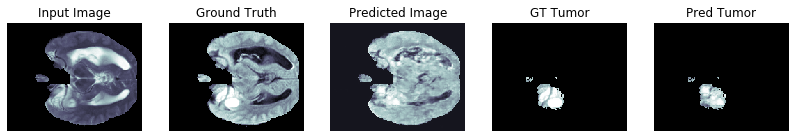

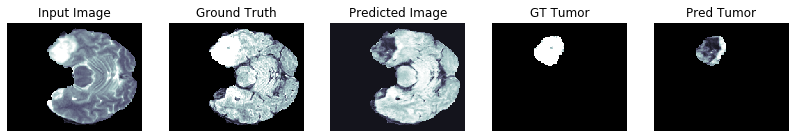

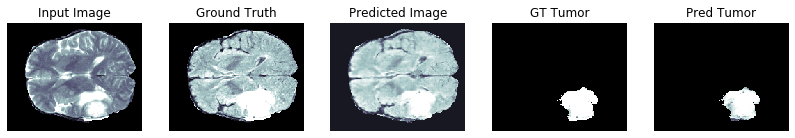

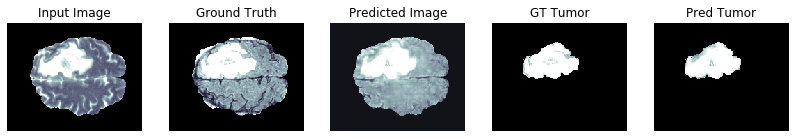

PSNR on validation set: 21.1395 ± 3.6354
MSE on validation set: 0.0103 ± 0.0097
SSIM on validation set: 0.7351 ± 0.1229

PSNR wrt tumor area on validation set: 33.3835 ± 10.2139
MSE wrt tumor area on validation set: 0.0013 ± 0.0019
SSIM wrt tumor area on validation set: 0.9727 ± 0.0306

Generator loss on validation set: 2.7414 ± 1.0760
Discriminator loss on validation set: 1.4284 ± 0.0258

Saving checkpoint for epoch 62 at ./drive/My Drive/checkpoints/gen_tflair_p2p/ckpt-13
Time taken for epoch 62 is 417.22386288642883 sec


Epoch:  63
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
.......................................

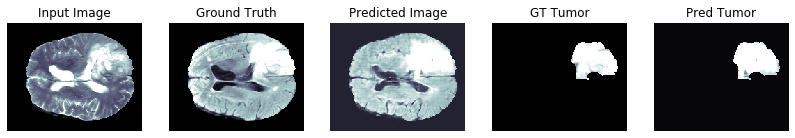

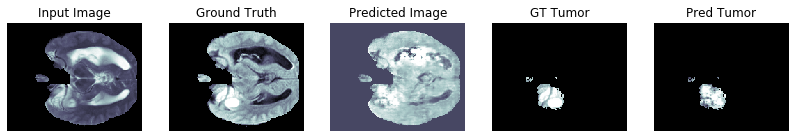

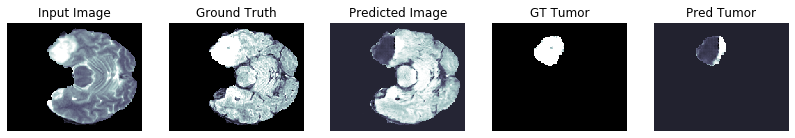

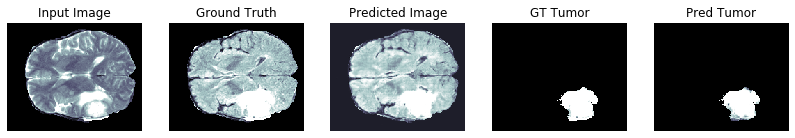

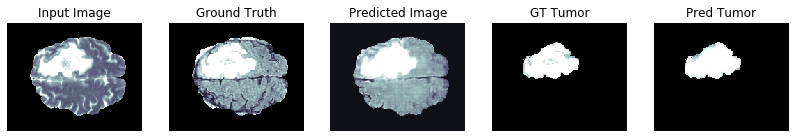

PSNR on validation set: 20.5006 ± 3.6846
MSE on validation set: 0.0118 ± 0.0099
SSIM on validation set: 0.7205 ± 0.1273

PSNR wrt tumor area on validation set: 32.2885 ± 10.8598
MSE wrt tumor area on validation set: 0.0018 ± 0.0028
SSIM wrt tumor area on validation set: 0.9667 ± 0.0518

Generator loss on validation set: 2.4906 ± 1.0578
Discriminator loss on validation set: 1.7327 ± 0.0418

Time taken for epoch 63 is 414.2397222518921 sec


Epoch:  64
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

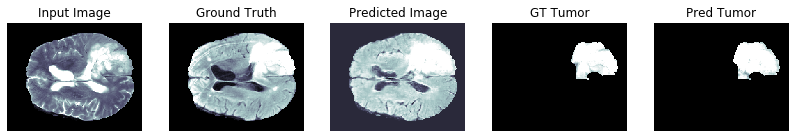

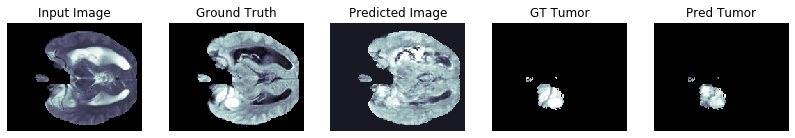

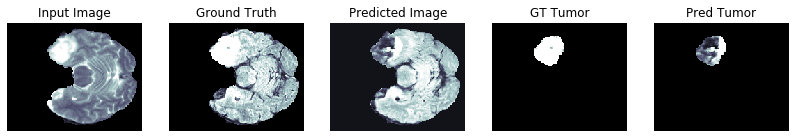

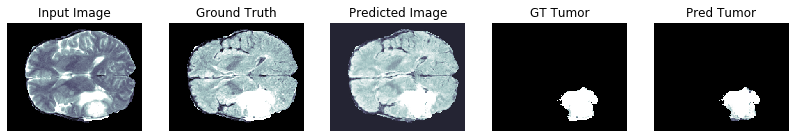

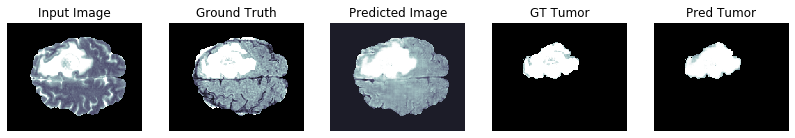

PSNR on validation set: 20.8847 ± 3.5940
MSE on validation set: 0.0108 ± 0.0097
SSIM on validation set: 0.7287 ± 0.1238

PSNR wrt tumor area on validation set: 32.9615 ± 11.3494
MSE wrt tumor area on validation set: 0.0015 ± 0.0022
SSIM wrt tumor area on validation set: 0.9712 ± 0.0348

Generator loss on validation set: 3.1665 ± 1.0070
Discriminator loss on validation set: 1.5562 ± 0.0255

Time taken for epoch 64 is 413.99202609062195 sec


Epoch:  65
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

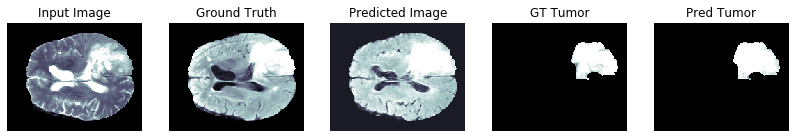

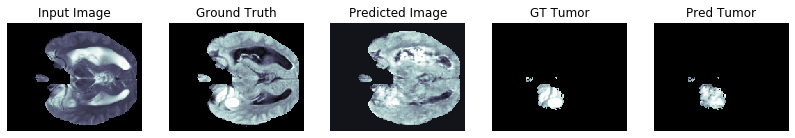

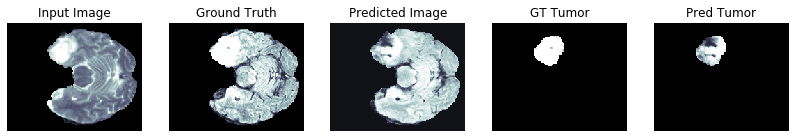

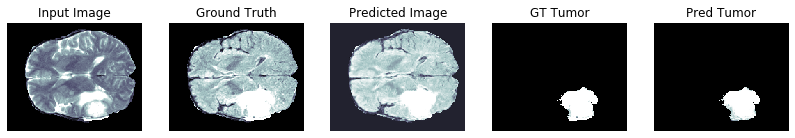

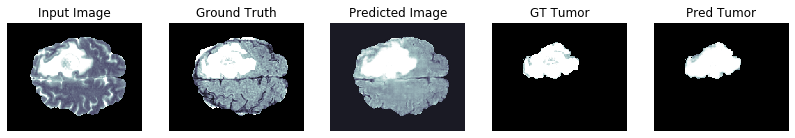

PSNR on validation set: 21.1052 ± 3.6720
MSE on validation set: 0.0104 ± 0.0097
SSIM on validation set: 0.7354 ± 0.1223

PSNR wrt tumor area on validation set: 33.9447 ± 9.6654
MSE wrt tumor area on validation set: 0.0011 ± 0.0015
SSIM wrt tumor area on validation set: 0.9763 ± 0.0276

Generator loss on validation set: 3.2679 ± 1.0363
Discriminator loss on validation set: 1.5505 ± 0.0356

Time taken for epoch 65 is 414.1060507297516 sec


Epoch:  66
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

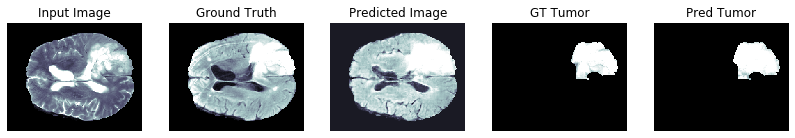

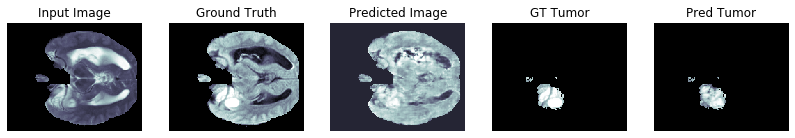

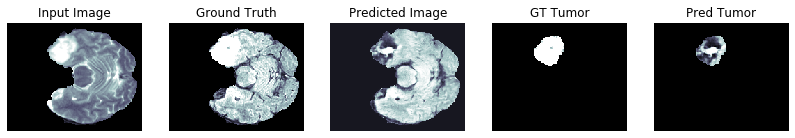

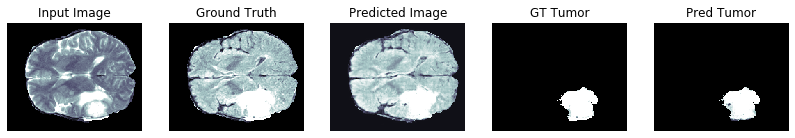

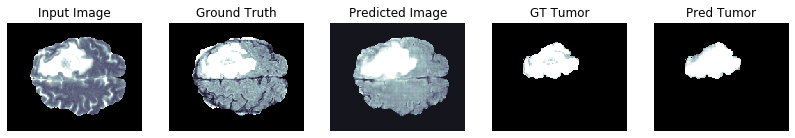

PSNR on validation set: 20.9513 ± 3.5958
MSE on validation set: 0.0106 ± 0.0094
SSIM on validation set: 0.7299 ± 0.1234

PSNR wrt tumor area on validation set: 33.0933 ± 9.7849
MSE wrt tumor area on validation set: 0.0014 ± 0.0021
SSIM wrt tumor area on validation set: 0.9716 ± 0.0425

Generator loss on validation set: 4.1682 ± 0.8507
Discriminator loss on validation set: 2.3486 ± 0.1866

Time taken for epoch 66 is 413.95951533317566 sec


Epoch:  67
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

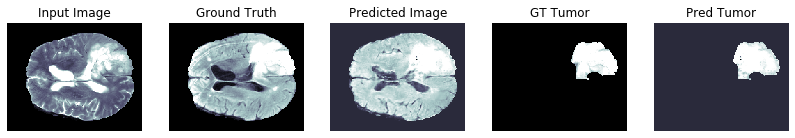

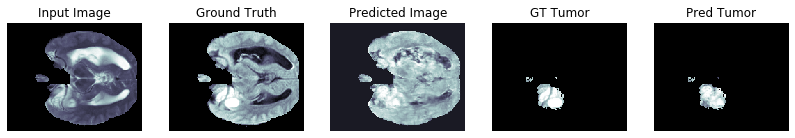

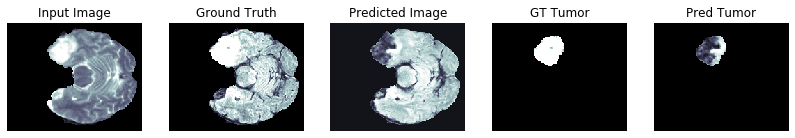

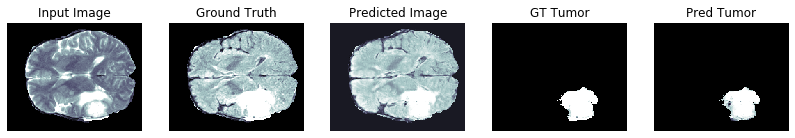

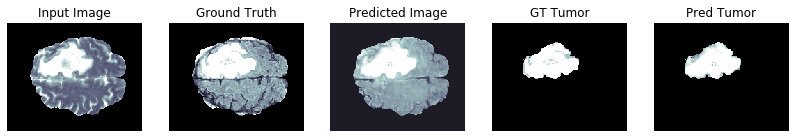

PSNR on validation set: 20.7377 ± 3.5643
MSE on validation set: 0.0111 ± 0.0095
SSIM on validation set: 0.7264 ± 0.1243

PSNR wrt tumor area on validation set: 32.3417 ± 9.9156
MSE wrt tumor area on validation set: 0.0016 ± 0.0024
SSIM wrt tumor area on validation set: 0.9677 ± 0.0353

Generator loss on validation set: 2.7807 ± 1.0707
Discriminator loss on validation set: 1.4050 ± 0.0212

Saving checkpoint for epoch 67 at ./drive/My Drive/checkpoints/gen_tflair_p2p/ckpt-14
Time taken for epoch 67 is 417.22053384780884 sec


Epoch:  68
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
........................................

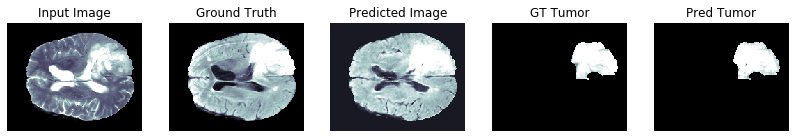

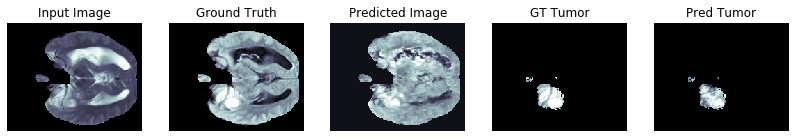

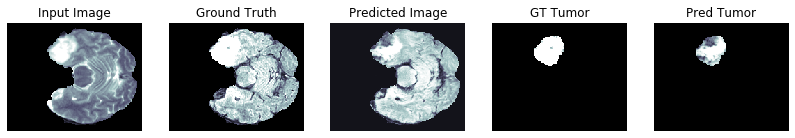

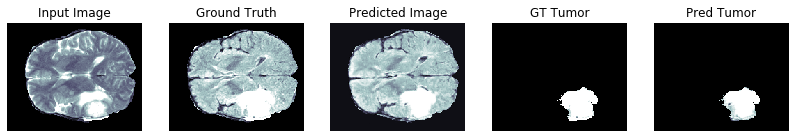

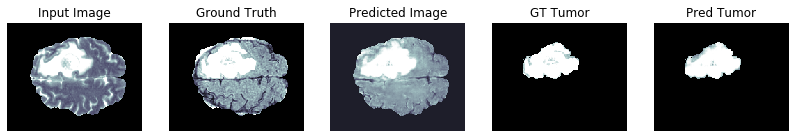

PSNR on validation set: 20.7545 ± 3.6549
MSE on validation set: 0.0112 ± 0.0097
SSIM on validation set: 0.7264 ± 0.1240

PSNR wrt tumor area on validation set: 32.8781 ± 11.7196
MSE wrt tumor area on validation set: 0.0014 ± 0.0018
SSIM wrt tumor area on validation set: 0.9723 ± 0.0268

Generator loss on validation set: 3.0825 ± 1.0381
Discriminator loss on validation set: 1.4534 ± 0.0307

Time taken for epoch 68 is 414.0116150379181 sec


Epoch:  69
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

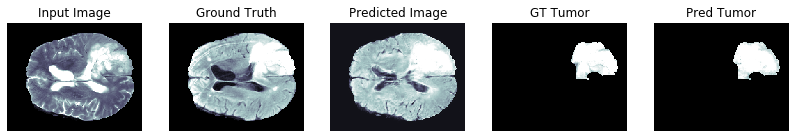

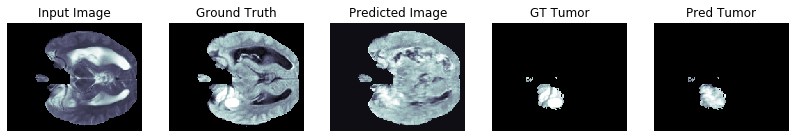

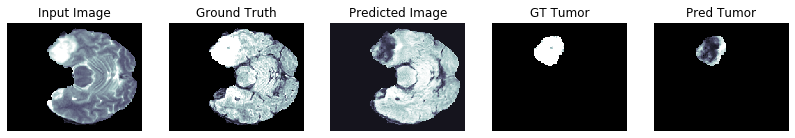

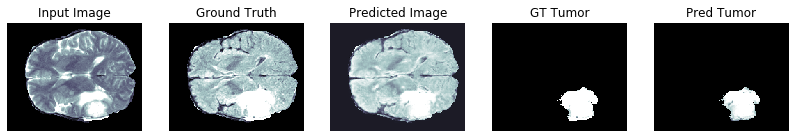

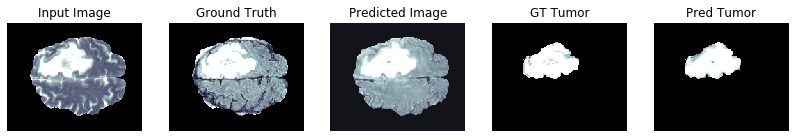

PSNR on validation set: 21.1501 ± 3.6561
MSE on validation set: 0.0103 ± 0.0098
SSIM on validation set: 0.7336 ± 0.1232

PSNR wrt tumor area on validation set: 33.7894 ± 10.3456
MSE wrt tumor area on validation set: 0.0011 ± 0.0017
SSIM wrt tumor area on validation set: 0.9745 ± 0.0282

Generator loss on validation set: 2.8952 ± 1.1522
Discriminator loss on validation set: 1.5049 ± 0.0501

Time taken for epoch 69 is 413.97851634025574 sec


Epoch:  70
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

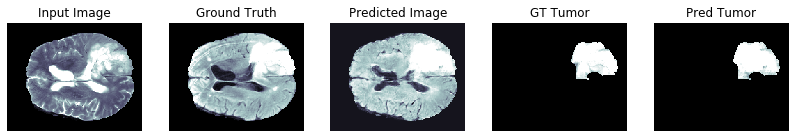

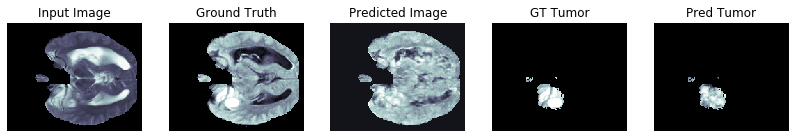

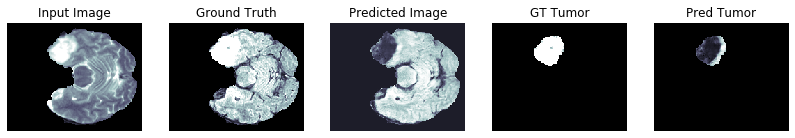

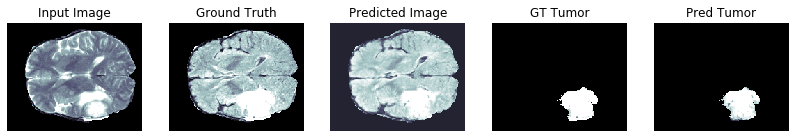

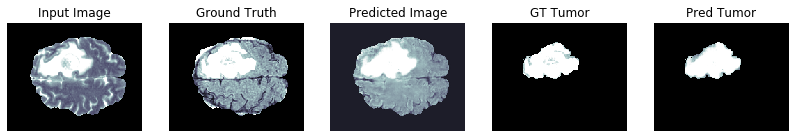

PSNR on validation set: 20.9162 ± 3.6850
MSE on validation set: 0.0108 ± 0.0098
SSIM on validation set: 0.7303 ± 0.1233

PSNR wrt tumor area on validation set: 32.7373 ± 9.5917
MSE wrt tumor area on validation set: 0.0016 ± 0.0027
SSIM wrt tumor area on validation set: 0.9691 ± 0.0465

Generator loss on validation set: 2.3687 ± 1.0878
Discriminator loss on validation set: 2.1150 ± 0.1204

Time taken for epoch 70 is 413.8738737106323 sec

Saving FINAL checkpoint for epoch 70 at ./drive/My Drive/checkpoints/gen_tflair_p2p/ckpt-15


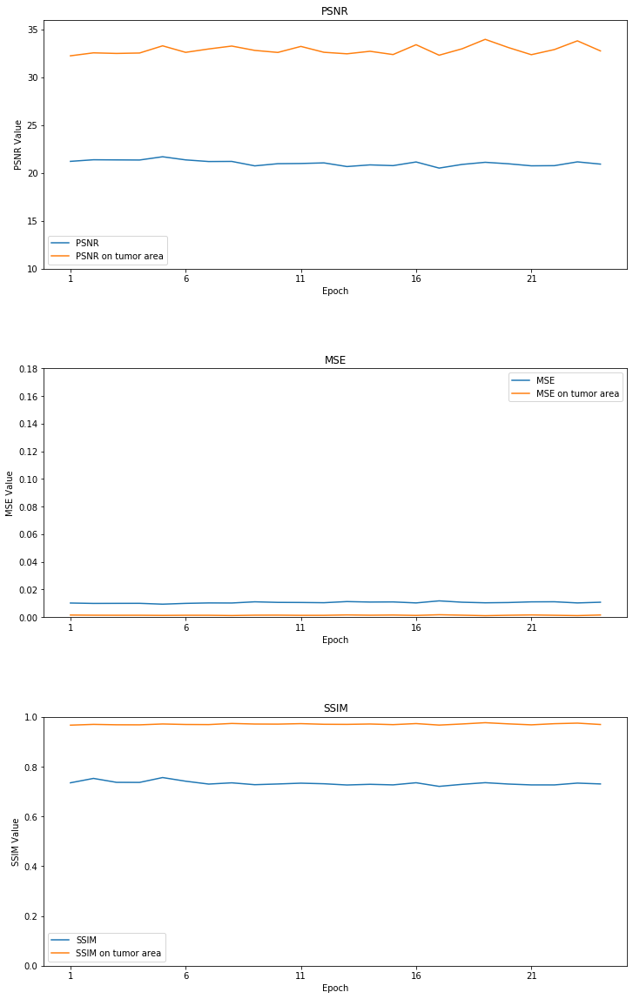

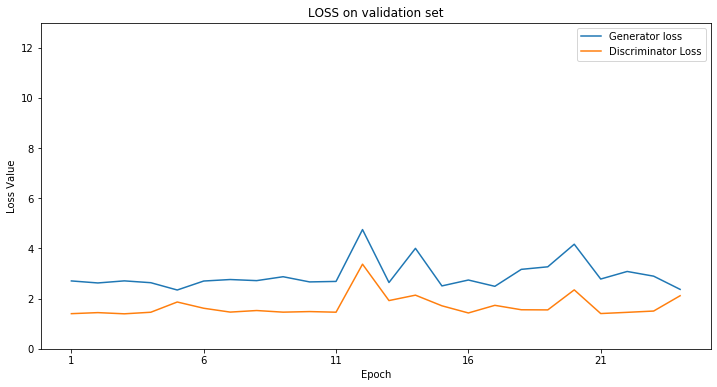

In [43]:
EPOCHS = 23
save_checkpoint = True         # want to save new checkpoints ? 
save_final_models = False       # want to save the model at the end of the training ? 
epochs_already_trained = 47      # this is just for the print. 
evaluate_tumor_quality = True   # compute & print metrics on tumor area ?
print_loss = True               # compute & print the validation loss ?


# Initialize the models, so that I don't have to restart the runtime again.

if tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, False):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = fit(training, EPOCHS, validation, save_checkpoint, 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)

elif tf.equal(evaluate_tumor_quality, False) and tf.equal(print_loss, True):
    psnr, mse, ssim, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)
    plot_loss(gen_loss, dis_loss)

elif tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, True):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                        epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)
    plot_loss(gen_loss, dis_loss)
else:
    psnr, mse, ssim = fit(training, EPOCHS, validation, save_checkpoint, 
                                                      epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)

# at the end, I'll save the models (I would need only the gen, but let's sayve also the disc  )
# (it saves the entire model to a HDF5 file)

if save_final_models:
    generator.save('drive/My Drive/MRI-generation/gen_TFlair_35ep_p2p.h5')

##Evaluating the final model with the test set

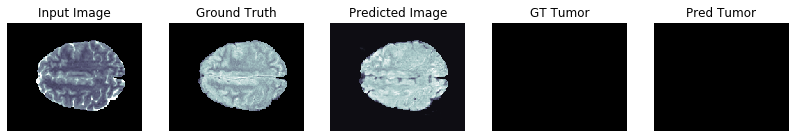

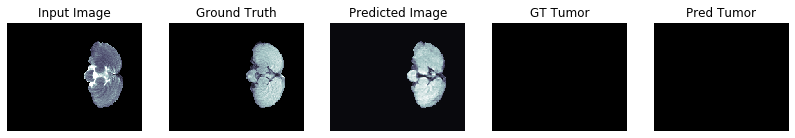

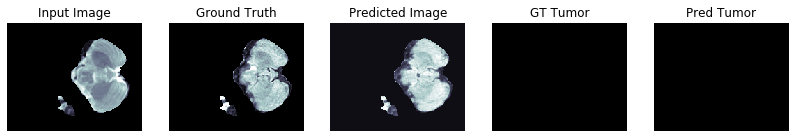

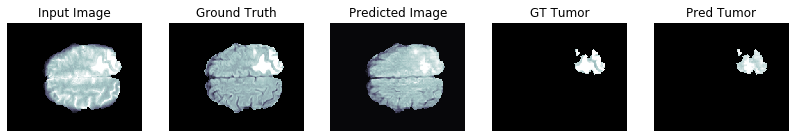

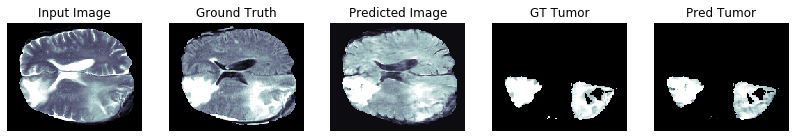

PSNR on test set: 21.5393 ± 3.5883
MSE on test set: 0.0092 ± 0.0068
SSIM on test set: 0.7327 ± 0.1320

PSNR wrt tumor area on test set: 32.7629 ± 13.6023
MSE wrt tumor area on test set: 0.0017 ± 0.0027
SSIM wrt tumor area on test set: 0.9665 ± 0.0328

Generator loss on test set: 2.8631 ± 0.6038
Discriminator loss on test set: 1.3982 ± 0.0051


(<tf.Tensor: shape=(), dtype=float32, numpy=21.539291>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.009241603>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.73265046>,
 <tf.Tensor: shape=(), dtype=float32, numpy=32.762905>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.0017372507>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.9664559>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.863076>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.3981507>)

In [44]:
# Let's check the scores of this model.

evaluate_GAN(generator, testing, 'test', True, True)

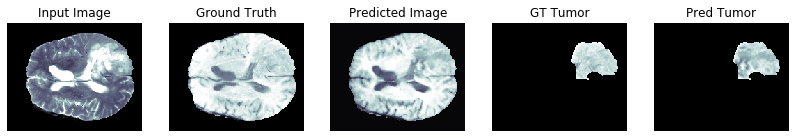

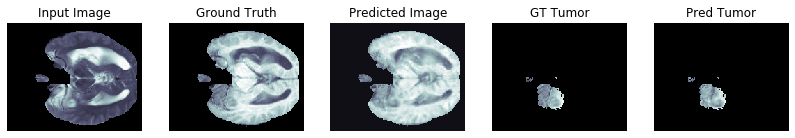

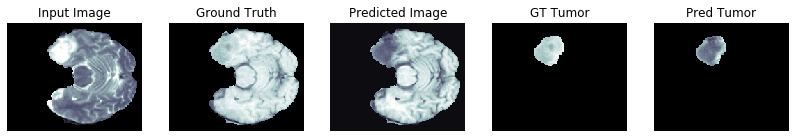

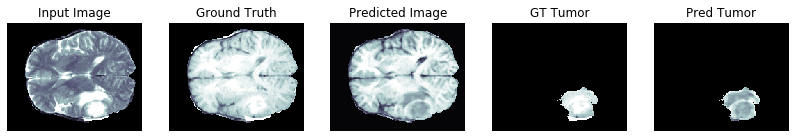

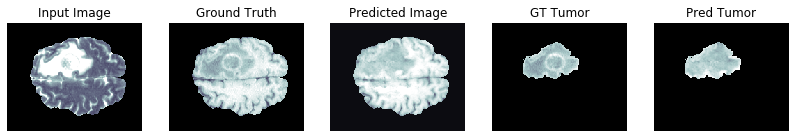

PSNR on validation set: 23.5030 ± 3.7175
MSE on validation set: 0.0058 ± 0.0039
SSIM on validation set: 0.8189 ± 0.0953

PSNR wrt tumor area on validation set: 33.9478 ± 9.9137
MSE wrt tumor area on validation set: 0.0011 ± 0.0013
SSIM wrt tumor area on validation set: 0.9692 ± 0.0283

Generator loss on validation set: 2.3062 ± 0.8403
Discriminator loss on validation set: 1.3973 ± 0.0058


(<tf.Tensor: shape=(), dtype=float32, numpy=23.502987>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.005806443>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.81885296>,
 <tf.Tensor: shape=(), dtype=float32, numpy=33.94779>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.0011071116>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.96922386>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.3062274>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.3972781>)

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

In [0]:
generator.save('drive/My Drive/MRI-generation/gen_T1_finalModel.h5')

## Considerations about metrics and normalization

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

In [0]:
for raw_record in testing.take(1):
    inp, ground_truth = take_images_from_raw(raw_record)

    prediction = generator(inp, training=False)
    inp, ground_truth, prediction = resize_with_crop(inp, ground_truth, prediction)

    prediction_normalized = mean_normalize(prediction)
    ground_truth_normalized = mean_normalize(ground_truth) 

    #prediction_normalized2 = min_max_normalize(prediction)
    
    # remove black images from ground_truth is not that necessary because it's enough to do it on the predictions. 
    # Anyway, just to be sure, let's remove them also from the ground truth (so the metrics of those images will be ignored)

    # BLACK IMAGES ARE DISCARDED IN ALL THE METRICS COMPUTED. Both in the case where I normalize and in the one in which I don't.
    # What if, in the case in which I don't normalize, I keep the black images? We would have significant differences.
    # For example PSNR would be 27.0207 ± 10.2544 instead of  25.2498 ± 2.8603 (with the model trained)
    ground_truth = black_images_to_nan(ground_truth)
    prediction = black_images_to_nan(prediction)

    #mean, std, psnr = compute_psnr(ground_truth, prediction_normalized2)
    #print("PSNR w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth_normalized, prediction_normalized)
    print("PSNR w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth, prediction)
    print("PSNR: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, ssim = compute_ssim(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth_normalized, prediction_normalized)
    print("SSIM w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth, prediction)
    print("SSIM: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, mse = compute_mse(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth_normalized, prediction_normalized)
    print("MSE w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth, prediction)
    print("MSE: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))

## Additional notes

In [0]:
# in the testing there are 28 patients so 128*28 = 3584 samples
# with a batch_size of 32, we have 112 elements in the prefetched TEST set so 3584 samples.
# in the VALIDATION SET: 108 elements * 32 (batch_size) = 3456 samples.
# in the TRAINING set: 876 elements * 32 = 28032

# each samples has then all the scans defined in the load_dataset (up to 4 scans + the segmented area)
# if batch size is set to 32, then there are less then 100 samples.

# training: with GPU it crashes, with TPU works. a bit more of 28000 samples -> 219 patients * 128 levels.

# training with 100 samples, batch size = 1 and TPU took 46 seconds
# training with 100 samples, batch size = 1 and GPU took 7/8 seconds

# training with 1000 samples, batch size = 1, resizing to 256, GPU took 54 seconds
# training with 1000 samples, batch size = 1, padding to 256, GPU took 52 seconds

# TRAINING TIMES WITH DIFFERENT BATCH SIZES:
# training with 16 samples and batch size = 64 (so 1024 samples fed to the GAN), TPU took 209 seconds

# training with 1000 samples and batch size = 1 (so 1000 samples fed to the GAN), GPU took about 490 seconds (8 min)
# training with 250 samples and bs = 4 (so 1000 samples fed to the GAN), GPU took 127 seconds!
# training with 128 samples and bs = 8 (so 1024 samples fed to the GAN), GPU took 75 seconds!
# training with 64 samples and bs = 16 (so 1024 samples fed to the GAN), GPU took 41 seconds!
# training with 31 samples and bs = 32 (so still 992 samples fed to the GAN), GPU took 28/32/33
# training with 16 samples and bs = 64 (so 1024 samples fed to the GAN), GPU took 23/25/26 seconds!

# training with 8 samples and bs = 128, GPU took 24/25( 21 in the most recent) sec! -> not so good quality
# (It has been observed in practice that when using a larger batch there is a significant degradation in the 
# quality of the model, as measured by its ability to generalize.)
# https://stats.stackexchange.com/questions/164876/tradeoff-batch-size-vs-number-of-iterations-to-train-a-neural-network

# The resulting model may not generalize as well as a model trained with a small batch size

# tradeoff between 32 and 64. 32 seems to be qualitatively more accurate but it's a bit slower. 
# before choosing, it would be better to implement also the quantitative metrics.

# from pix2pix paper: use batch sizes between 1 and 10 depending on the experiment


# In general, batch size of 32 is a good starting point, and you should also try with 64, 128, and 256. 
# Other values (lower or higher) may be fine for some data sets, but the given range is generally the best to 
# start experimenting with. Though, under 32, it might get too slow because of significantly lower computational speed, 
# because of not exploiting vectorization to the full extent.  
# If you get an "out of memory" error, you should try reducing the mini-batch size anyway.


# training with 4 samples and bs = 256, GPU run out of memory. Resource exhausted.

In [0]:
# np.FUNCTION VS tf.FUNCTION

# np =  training with 31 samples and bs = 32 (992 samples fed to the GAN), GPU took 28/32/33
# training with 32 samples and bs = 32 (1024 samples fed to the GAN), GPU took 14/15/16/17 seconds 